In [1]:
import numpy as np
import imutils.paths
import os
import cv2
from typing import Tuple, List

In [2]:
def find_chessboard_corners(gray: np.array, XX: int, YY:int, flags: int, criteria: Tuple[int, int ,float], winsize: Tuple[int, int]):
    ret, corners = cv2.findChessboardCorners(gray, (XX, YY), cv2.CALIB_CB_ADAPTIVE_THRESH+cv2.CALIB_CB_FAST_CHECK
                                            +cv2.CALIB_CB_NORMALIZE_IMAGE)
    if ret:
        # refining pixel coordinates for given 2d points
        corners2 = cv2.cornerSubPix(gray, corners, winsize, (-1, -1), criteria)
        return True, corners2
    else:
        return False, []
    
def calibrate_camera(image_path_list: List[str], corners_3d_list: List[List[float]], 
                  XX: int, YY: int,
                  find_chessboard_corners_flags: int = cv2.CALIB_CB_ADAPTIVE_THRESH+cv2.CALIB_CB_FAST_CHECK
                                            +cv2.CALIB_CB_NORMALIZE_IMAGE,
                  corner_refine_criteria=(cv2.TERM_CRITERIA_MAX_ITER | cv2.TERM_CRITERIA_EPS, 30, 0.001), 
                  corner_refine_winsize=(11, 11),
                  verbose=True) \
    -> Tuple[bool, np.array, np.array, np.array, np.array]:
    imgpoints = []
    objpoints = []
    image_size = None
    for i in range(0, len(image_path_list)):
        image_path = image_path_list[i]
        img = cv2.imread(image_path)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        if image_size is None:
            image_size = gray.shape[::-1]
        find_corners_ret, corners = find_chessboard_corners(gray, XX, YY, find_chessboard_corners_flags, corner_refine_criteria, corner_refine_winsize)
        
        # corners: order in row by row, and left to right in each row
        if find_corners_ret:
            imgpoints.append(corners)
            objp = corners_3d_list[i]
            objpoints.append(objp)
        else:
            print(f"Can not find checkerboard corners of {image_path}, Skip.")
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_size, None, None)
    
    mean_error = 0
    for i in range(len(objpoints)):
        imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
        error = cv2.norm(imgpoints[i], imgpoints2, cv2.NORM_L2)/len(imgpoints2)
        if verbose:
            print(f"{i} error: {error}")
        mean_error += error
    if verbose:
        print( "total error: {}".format(mean_error/len(objpoints)) )
    return ret, mtx, dist, rvecs, tvecs

In [3]:
# 角点的个数以及棋盘格间距
XX = 11 #标定板的中长度对应的角点的个数
YY = 8  #标定板的中宽度对应的角点的个数
# define the dimensions of the checkerboard, XX=<count of white or black block in row>-1, YY=<number of white or black 
# block in column>-1
L = 0.02 #标定板一格的长度  单位为米
CHECKERBOARD = (XX, YY)
image_paths = list(imutils.paths.list_images(r'../../data/sample_data/camera_calib/data1'))
image_paths.sort(key=lambda x: int(os.path.split(x)[-1].split('.')[0].split('_')[-1]))

In [4]:
"""Get 3D points"""
# Creating vector to store vectors of 3D points for each checkboard image
objpoints = []

for i in range(0, len(image_paths)):
    # 获取标定板角点的位置
    objp = np.zeros((XX * YY, 3), np.float32)
    objp[:, :2] = np.mgrid[0:XX, 0:YY].T.reshape(-1, 2)     # 将世界坐标系建在标定板上，所有点的Z坐标全部为0，所以只需要赋值x和y
    # Take the first corner as origin of world coordinate
    objp*=L
    objpoints.append(objp)

In [5]:
"""Performing camera calibration by passing the value of known 3D point(objpoints) and corresponding pixel coordinates 
of the detected corners(imgpoints)"""
ret, mtx, dist, rvecs, tvecs = calibrate_camera(image_paths, objpoints, XX, YY, verbose=True)

0 error: 0.006072261178458663
1 error: 0.0075083352810091895
2 error: 0.006220692144053249
3 error: 0.006486784326629269
4 error: 0.006502322783036326
5 error: 0.00762046062324574
6 error: 0.006450640432264474
7 error: 0.006994525580538948
8 error: 0.006805959357543051
9 error: 0.00822454212845839
10 error: 0.00844272847318616
11 error: 0.007802840076631743
12 error: 0.007089850171650184
13 error: 0.0070021067421624315
14 error: 0.00717269819045267
15 error: 0.00796040026047864
16 error: 0.007509697667227769
17 error: 0.008451651094271062
18 error: 0.007313886215753615
19 error: 0.007335225030217168
20 error: 0.00710848926026616
21 error: 0.00785107723220956
22 error: 0.009234682088568034
23 error: 0.007726193099791044
24 error: 0.009088892619727347
25 error: 0.009936068482260925
26 error: 0.008613906033719263
27 error: 0.009525942232759424
28 error: 0.00828325726233519
29 error: 0.007816222378266308
30 error: 0.007642915108638481
31 error: 0.008792400507895546
32 error: 0.007345841327

In [6]:
f'Camera matrix: {mtx}' # 内参数矩阵

'Camera matrix: [[640.40796323   0.         641.14120105]\n [  0.         640.53107338 363.15336777]\n [  0.           0.           1.        ]]'

In [7]:
f'Dist coeffs: {dist}' # 畸变系数 distortion cofficients = (k_1,k_2,p_1,p_2,k_3)

'Dist coeffs: [[-0.0495053   0.05181659 -0.00089224 -0.00036719 -0.01195582]]'

In [8]:
f'Rotation vector: {rvecs}' # The rotation of the camera with respect of world coordinate (checkboard left-top corner 
# as origin)

'Rotation vector: (array([[ 0.01893309],\n       [-0.28759691],\n       [ 0.02434002]]), array([[0.23613421],\n       [0.20762622],\n       [0.22659382]]), array([[-0.00648239],\n       [ 0.09564497],\n       [ 0.16131452]]), array([[-0.18636783],\n       [ 0.0754619 ],\n       [ 0.11938339]]), array([[-0.34416418],\n       [ 0.03628778],\n       [ 0.10390636]]), array([[0.05471816],\n       [0.39892267],\n       [0.2332832 ]]), array([[-0.20196941],\n       [ 0.39203909],\n       [ 0.23236356]]), array([[-0.40962677],\n       [ 0.360561  ],\n       [ 0.23468342]]), array([[ 0.02975037],\n       [-0.25589126],\n       [-0.09281976]]), array([[ 0.30172194],\n       [-0.25369271],\n       [ 0.00810387]]), array([[ 0.47406415],\n       [-0.26875035],\n       [ 0.07150181]]), array([[ 0.68931596],\n       [ 0.01005022],\n       [-0.0295254 ]]), array([[ 0.41168338],\n       [ 0.05903763],\n       [-0.00585986]]), array([[ 0.11684228],\n       [ 0.06680652],\n       [-0.06709741]]), array([

In [9]:
np.array(rvecs).shape # (image_count, 3, 1)

(35, 3, 1)

In [10]:
f'Translation vector: {tvecs}' # The translation of the camera with respect of world coordinate (checkboard left-top 
# corner as origin)

'Translation vector: (array([[-0.09659848],\n       [-0.06948602],\n       [ 0.20579122]]), array([[-0.05131995],\n       [-0.09317642],\n       [ 0.23124378]]), array([[-0.01906393],\n       [-0.1081165 ],\n       [ 0.26562422]]), array([[-0.02321251],\n       [-0.1005012 ],\n       [ 0.27876445]]), array([[-0.02642338],\n       [-0.10214449],\n       [ 0.28603146]]), array([[-0.03304204],\n       [-0.09819974],\n       [ 0.26777471]]), array([[-0.02564354],\n       [-0.11343084],\n       [ 0.29440194]]), array([[-0.02513106],\n       [-0.12026465],\n       [ 0.31408505]]), array([[-0.00328475],\n       [-0.06821741],\n       [ 0.19891549]]), array([[ 0.002163  ],\n       [-0.05521432],\n       [ 0.18088616]]), array([[ 0.00309871],\n       [-0.04430496],\n       [ 0.16957346]]), array([[-0.11320797],\n       [-0.02710352],\n       [ 0.20879276]]), array([[-0.11705132],\n       [-0.06488943],\n       [ 0.22857363]]), array([[-0.11921376],\n       [-0.06366837],\n       [ 0.23807837]])

In [11]:
np.array(tvecs).shape # (image_count, 3, 1)

(35, 3, 1)

much better result than using only one view to calibrate camera

../../data/sample_data/camera_calib/data1/chessboard_01.png


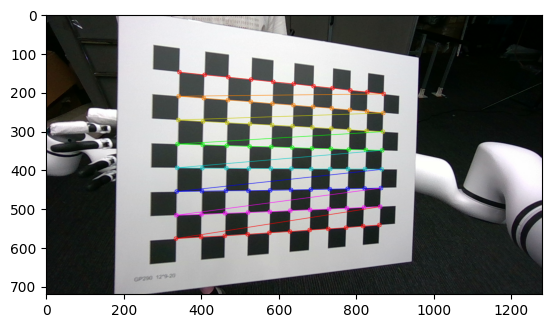

../../data/sample_data/camera_calib/data1/chessboard_02.png


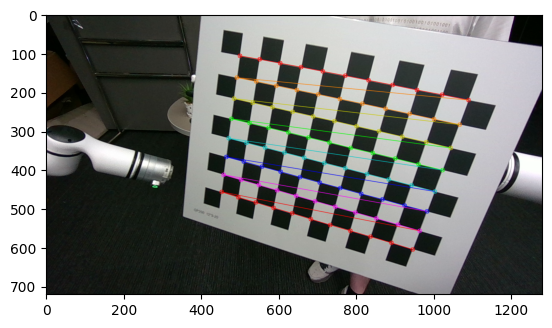

../../data/sample_data/camera_calib/data1/chessboard_03.png


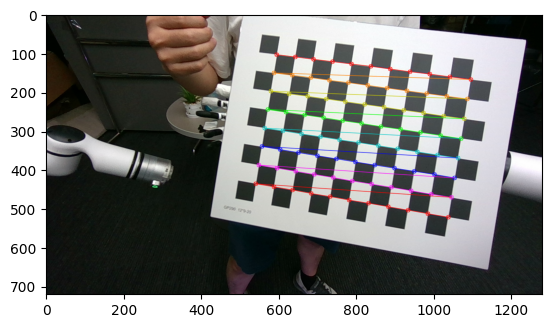

../../data/sample_data/camera_calib/data1/chessboard_04.png


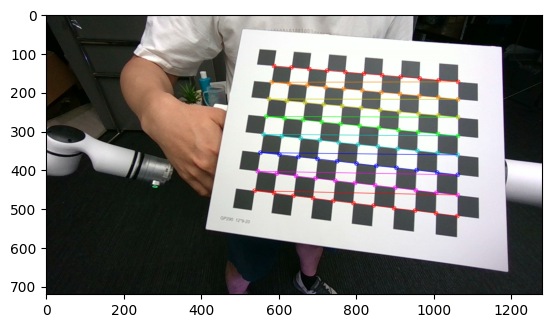

../../data/sample_data/camera_calib/data1/chessboard_05.png


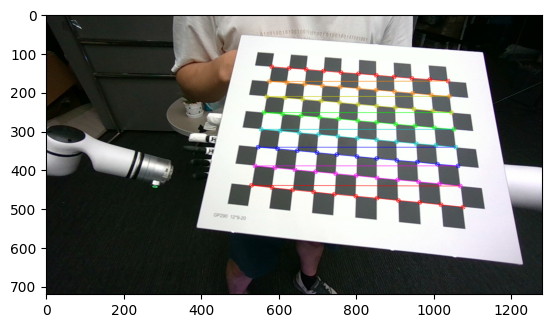

../../data/sample_data/camera_calib/data1/chessboard_06.png


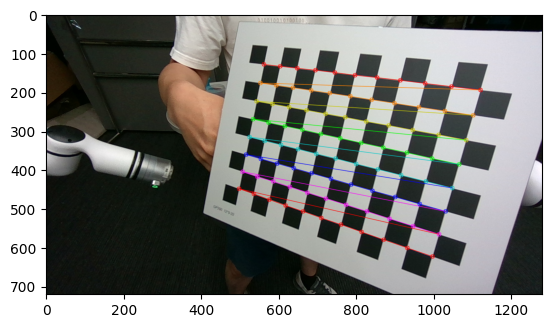

../../data/sample_data/camera_calib/data1/chessboard_07.png


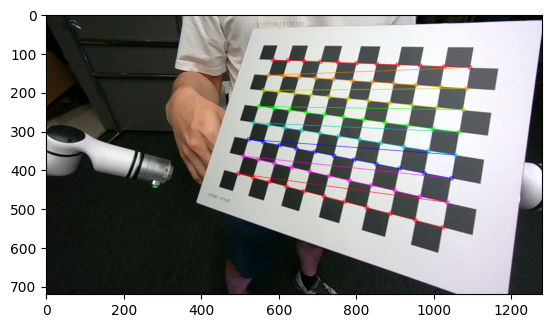

../../data/sample_data/camera_calib/data1/chessboard_08.png


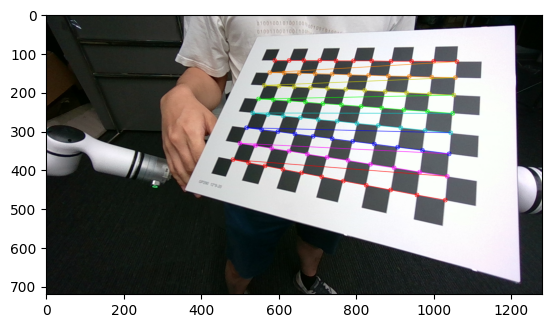

../../data/sample_data/camera_calib/data1/chessboard_09.png


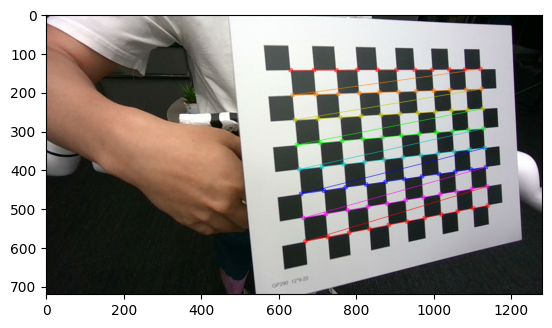

../../data/sample_data/camera_calib/data1/chessboard_10.png


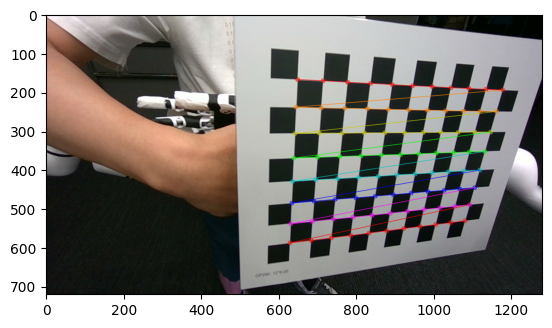

../../data/sample_data/camera_calib/data1/chessboard_11.png


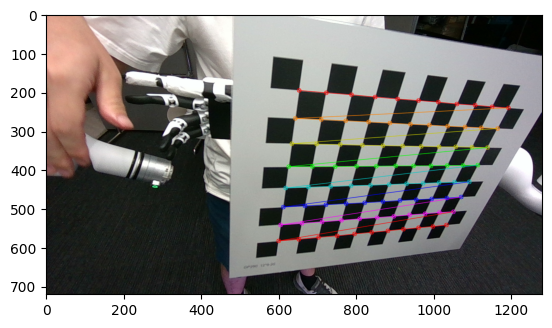

../../data/sample_data/camera_calib/data1/chessboard_12.png


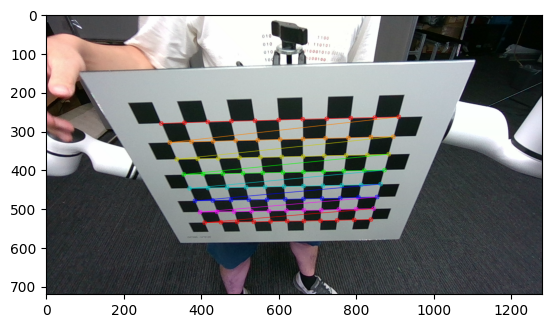

../../data/sample_data/camera_calib/data1/chessboard_13.png


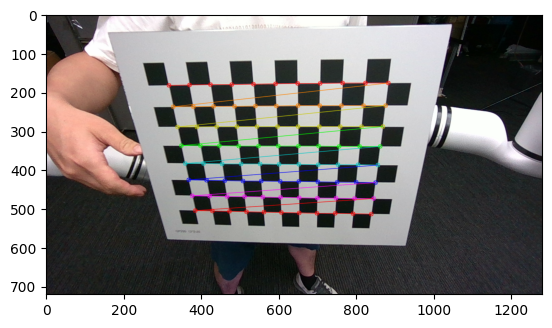

../../data/sample_data/camera_calib/data1/chessboard_14.png


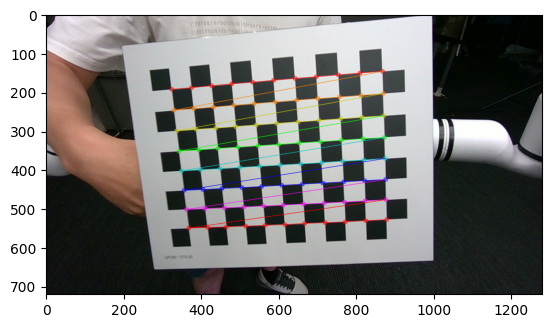

../../data/sample_data/camera_calib/data1/chessboard_15.png


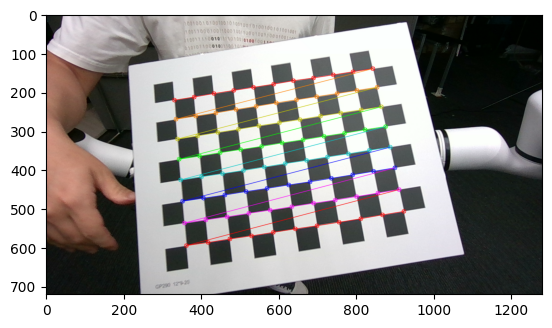

../../data/sample_data/camera_calib/data1/chessboard_16.png


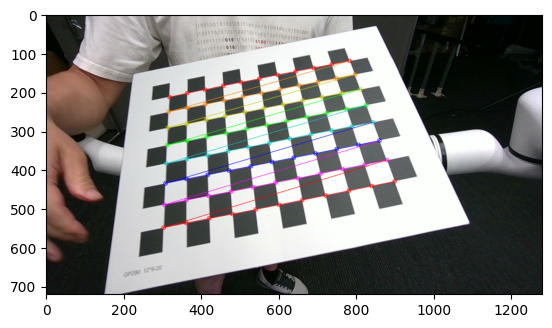

../../data/sample_data/camera_calib/data1/chessboard_17.png


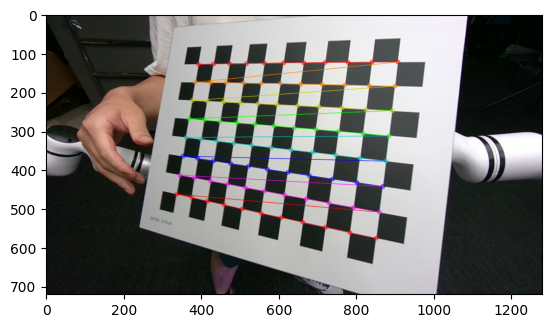

../../data/sample_data/camera_calib/data1/chessboard_18.png


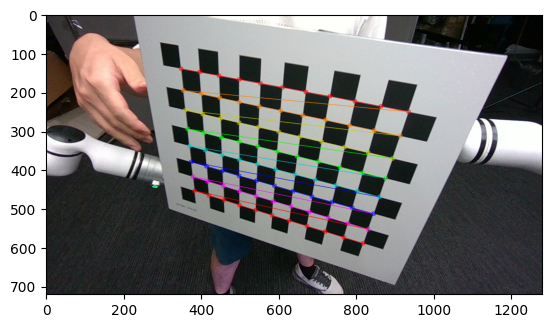

../../data/sample_data/camera_calib/data1/chessboard_19.png


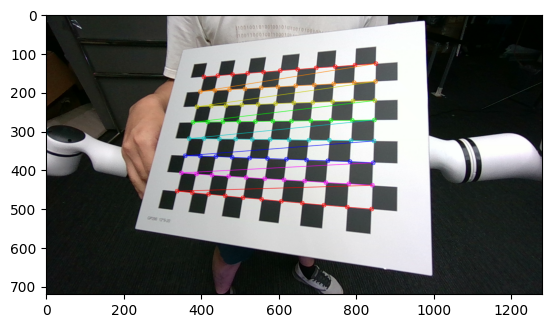

../../data/sample_data/camera_calib/data1/chessboard_20.png


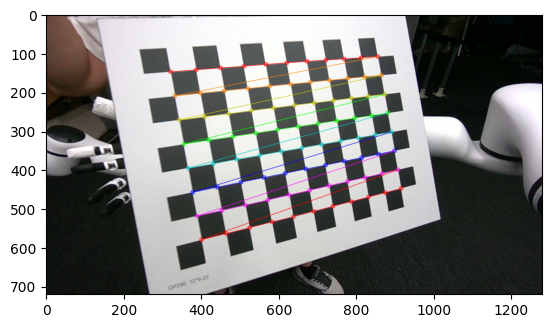

../../data/sample_data/camera_calib/data1/chessboard_21.png


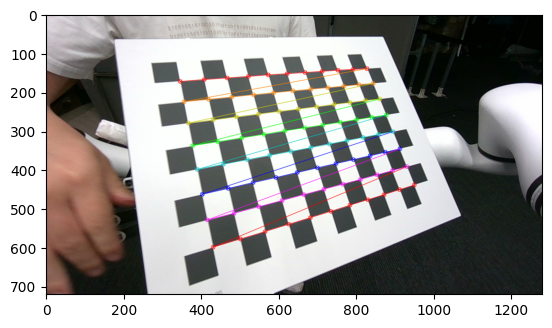

../../data/sample_data/camera_calib/data1/chessboard_22.png


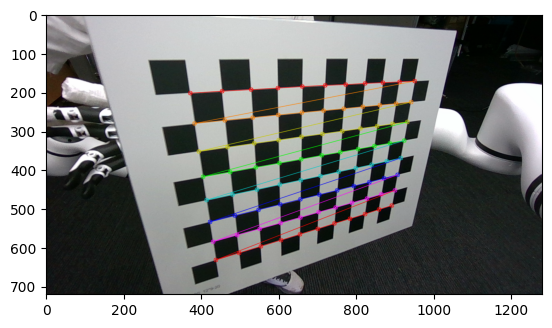

../../data/sample_data/camera_calib/data1/chessboard_23.png


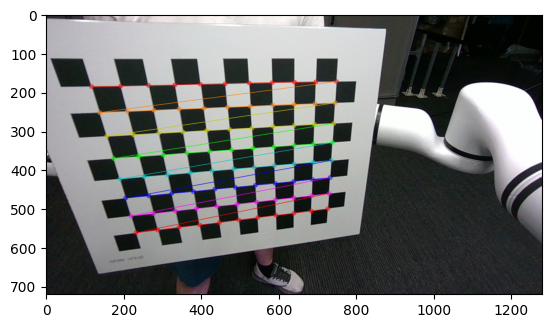

../../data/sample_data/camera_calib/data1/chessboard_24.png


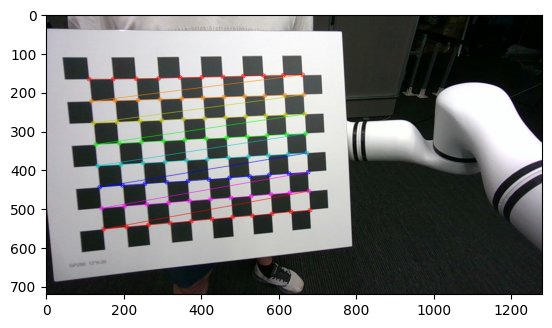

../../data/sample_data/camera_calib/data1/chessboard_25.png


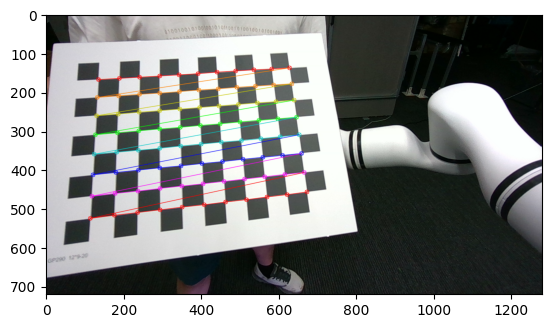

../../data/sample_data/camera_calib/data1/chessboard_26.png


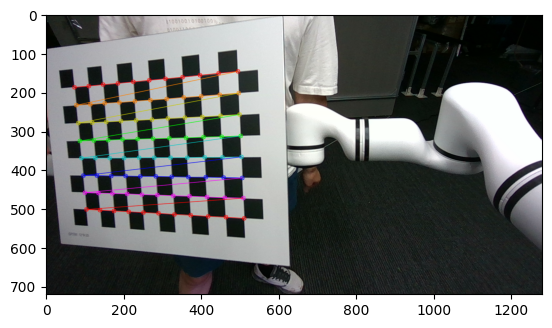

../../data/sample_data/camera_calib/data1/chessboard_27.png


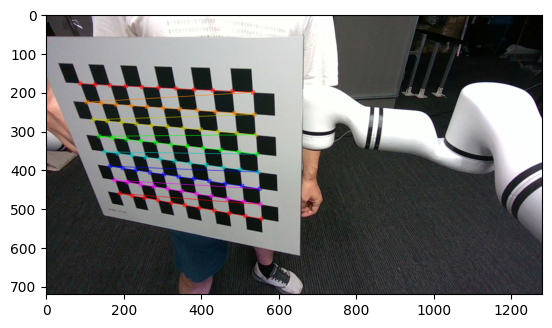

../../data/sample_data/camera_calib/data1/chessboard_28.png


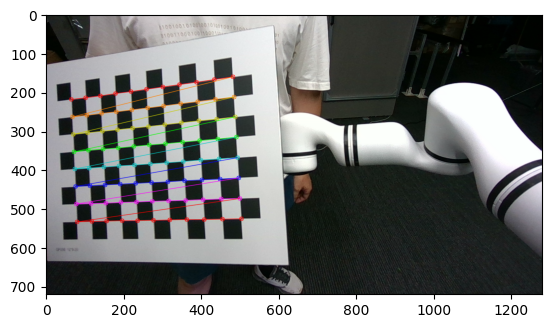

../../data/sample_data/camera_calib/data1/chessboard_29.png


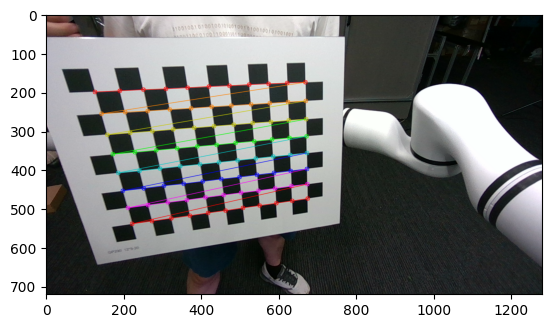

../../data/sample_data/camera_calib/data1/chessboard_30.png


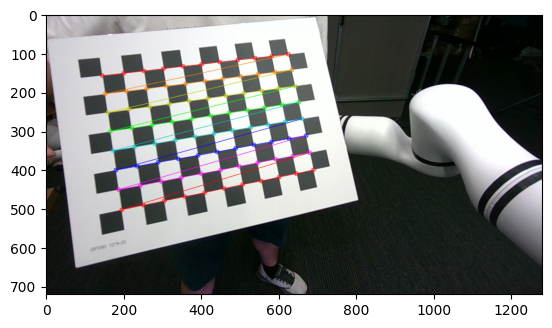

../../data/sample_data/camera_calib/data1/chessboard_31.png


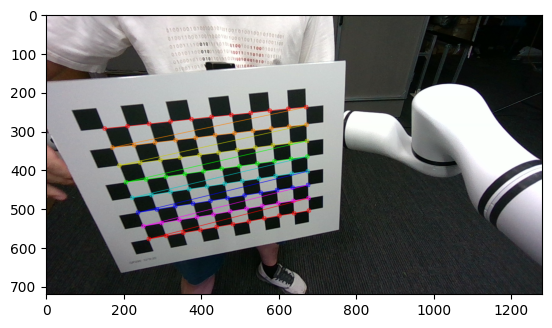

../../data/sample_data/camera_calib/data1/chessboard_32.png


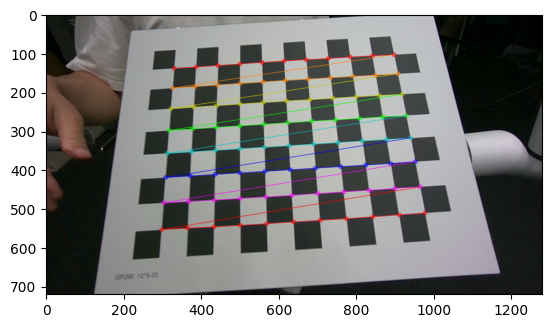

../../data/sample_data/camera_calib/data1/chessboard_33.png


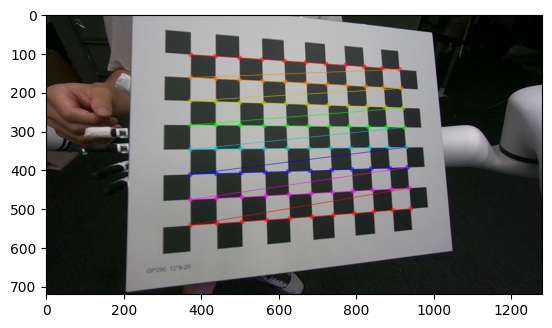

../../data/sample_data/camera_calib/data1/chessboard_34.png


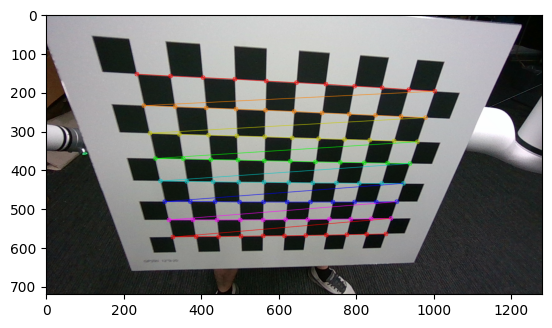

../../data/sample_data/camera_calib/data1/chessboard_35.png


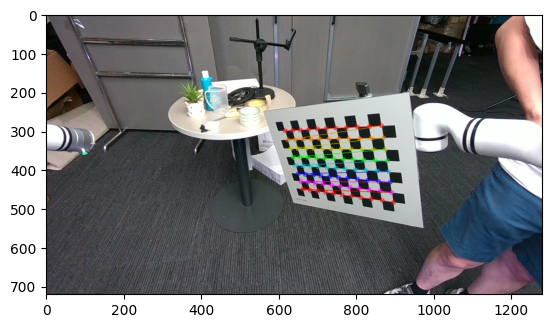

In [12]:
import cv2
import matplotlib.pyplot as plt

imgpoints = []
image_size = None
for i in range(0, len(image_paths)):
# for i in range(0, 1):
    image_path = image_paths[i]
    print(image_path)
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    if image_size is None:
        image_size = gray.shape[::-1]
    find_corners_ret, corners = find_chessboard_corners(gray, XX, YY, flags= cv2.CALIB_CB_ADAPTIVE_THRESH+cv2.CALIB_CB_FAST_CHECK
                                            +cv2.CALIB_CB_NORMALIZE_IMAGE,
                  criteria=(cv2.TERM_CRITERIA_MAX_ITER | cv2.TERM_CRITERIA_EPS, 30, 0.001), 
                  winsize=(11, 11))
    
    # corners: order in row by row, and left to right in each row
    if find_corners_ret:
        imgpoints.append(corners)
    else:
        print(f"Can not find checkerboard corners of {image_path}, Skip.")
        
    #img_draw = cv2.drawChessboardCorners(img, CHECKERBOARD, corners, ret)

    # plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    # plt.scatter(corners[:, :, 0], corners[:, :, 1])
    img_draw = cv2.drawChessboardCorners(img, CHECKERBOARD, corners, find_corners_ret)
    plt.imshow(cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB))
    plt.show()